# Maizels learned trajectories over cell-type-labelled population data

This notebook loads a trained D3→D8 PCA50 flow-map model, follows one held-out D3 cell through the learned dynamics, and overlays that path on the full labelled population. Each path segment is coloured by the frozen classifier's inferred cell type at that stage. A wider red underlay begins where the inferred sequence first violates the configured lineage graph.

The default projection is a UMAP fitted once to the PCA50 population and then used to transform the trajectory. Set `PROJECTION = "pc12"` for an exact, fast PC1/PC2 view. UMAP is useful for seeing cell-type regions, but it can distort path geometry; use PC1/PC2 as the geometry check.

Run this notebook in the repository's `flowmaps` conda environment. The configuration cell is the only cell that normally needs editing.

In [41]:
# Imports and user settings
import os
import sys
from pathlib import Path

# Find the flow-maps repository whether Jupyter starts in the repo or notebooks/.
ROOT = next(
    p for p in [Path.cwd(), *Path.cwd().parents]
    if (p / "py" / "common" / "maizels.py").exists()
)
CACHE_DIR = ROOT / ".cache"
(CACHE_DIR / "numba").mkdir(parents=True, exist_ok=True)
(CACHE_DIR / "matplotlib").mkdir(parents=True, exist_ok=True)
os.environ.setdefault("NUMBA_CACHE_DIR", str(CACHE_DIR / "numba"))
os.environ.setdefault("MPLCONFIGDIR", str(CACHE_DIR / "matplotlib"))
sys.path.insert(0, str(ROOT / "py"))

import flax
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
# Keep notebook labels independent of any global LaTeX Matplotlib setting.
plt.rcParams["text.usetex"] = False
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib.collections import LineCollection
from matplotlib.lines import Line2D
from sklearn.neighbors import NearestNeighbors

from common import flow_map, maizels, state_utils
from configs.maizels_pca50 import get_config

DATASET = ROOT / "celltype_classification_pca50_dataset.csv.gz"
CLASSIFIER = ROOT / "celltype_classifier_pca50.npz"
CHECKPOINT = ROOT / (
    "outputs/maizels_local_runs/"
    "maizels_pca50_bio_prior_constrained_flow_map_best.pkl"
)
MODEL_CONFIG_VARIANT = 4  # network-compatible constrained flow-map setup
EMA_FACTOR = 0

PROJECTION = os.getenv("MAIZELS_PROJECTION", "pc12")  # "umap" or "pc12"
UMAP_FIT_MAX = 18_000
BACKGROUND_MAX = 30_000
RANDOM_SEED = 23

TRAJECTORY_MODE = "composed"  # "composed", "composed", or "euler"
N_STEPS = 100
START_CELL_TYPE = "NMP"
START_RANK = 0  # 0 = most central held-out cell of this type
LINEAGE_MODE = "descendant"  # matches the experiment; "direct" is stricter
PROB_THRESHOLD = 0.0
MARGIN_THRESHOLD = 0.0
K_NEIGHBOURS = 50

CELLTYPE_COLORS = {
    "NMP": "#00afff", "Mesoderm": "#20c505",
    "Early_Neural": "#db00ff", "Neural": "#ff00a7",
    "p3": "#ffab02", "V3": "#ffd966",
    "pMN": "#ff0000", "MN": "#ff8080", "FP": "#a52a2a",
}
print(f"Repository: {ROOT}")
print(f"JAX devices: {jax.devices()}")

Repository: /Users/harryamad/Desktop/drive/2026/flow-maps
JAX devices: [CpuDevice(id=0)]


In [42]:
# Load the labelled PCA50 population.
for path in (DATASET, CLASSIFIER, CHECKPOINT):
    if not path.exists():
        raise FileNotFoundError(path)

data = maizels.load_pca50_dataset(DATASET)
X = data["x"].astype(np.float32)
cell_types = data["cell_types"].astype(str)
timepoints = data["timepoints"].astype(str)
time_values = data["time_values"].astype(float)
celltype_order = [c for c in maizels.CLASS_NAMES if c in set(cell_types)]

population_summary = pd.crosstab(
    pd.Categorical(timepoints, categories=sorted(set(timepoints), key=maizels.parse_timepoint)),
    pd.Categorical(cell_types, categories=celltype_order),
)
print(f"Loaded {X.shape[0]:,} cells in {X.shape[1]} PCA dimensions.")
display(population_summary)

Loaded 44,713 cells in 50 PCA dimensions.


col_0,Early_Neural,FP,MN,Mesoderm,NMP,Neural,V3,p3,pMN
row_0,,,,,,,,,
D3,3,0,0,276,2921,3,0,0,0
D3.2,475,0,0,207,2132,10,0,0,0
D3.4,1105,0,0,373,1743,49,0,0,0
D3.6,1666,0,0,549,850,687,0,0,0
D3.8,839,0,0,529,408,1595,0,0,0
D4,29,0,15,1545,100,3294,0,0,6
D5,3,32,1125,3461,0,32,3,18,2575
D6,0,305,771,1523,1,0,58,244,1899
D7,0,732,679,1203,1,0,1407,1813,1663


In [43]:
# Fit the common 2D projection used for both background cells and trajectories.
rng = np.random.default_rng(RANDOM_SEED)

def stratified_sample_indices(labels, n_total, seed):
    labels = np.asarray(labels)
    if n_total >= len(labels):
        return np.arange(len(labels))
    local_rng = np.random.default_rng(seed)
    chosen = []
    for label in np.unique(labels):
        idx = np.flatnonzero(labels == label)
        n_label = max(1, round(n_total * len(idx) / len(labels)))
        chosen.extend(local_rng.choice(idx, min(n_label, len(idx)), replace=False))
    chosen = np.asarray(chosen, dtype=int)
    if len(chosen) > n_total:
        chosen = local_rng.choice(chosen, n_total, replace=False)
    return np.sort(chosen)

background_idx = stratified_sample_indices(cell_types, BACKGROUND_MAX, RANDOM_SEED + 1)

if PROJECTION.lower() == "pc12":
    population_xy = X[:, :2]
    project = lambda values: np.asarray(values)[:, :2]
    axis_labels = ("PC1", "PC2")
elif PROJECTION.lower() == "pc13":
    population_xy = X[:, [0, 2]]
    project = lambda values: np.asarray(values)[:, [0, 2]]
    axis_labels = ("PC1", "PC3")
elif PROJECTION.lower() == "umap":
    import umap
    fit_idx = stratified_sample_indices(cell_types, UMAP_FIT_MAX, RANDOM_SEED + 2)
    reducer = umap.UMAP(
        n_neighbors=30, min_dist=0.25, metric="euclidean",
        random_state=RANDOM_SEED, transform_seed=RANDOM_SEED,
    ).fit(X[fit_idx])
    population_xy = reducer.transform(X).astype(np.float32)
    project = lambda values: reducer.transform(np.asarray(values, dtype=np.float32))
    axis_labels = ("UMAP1", "UMAP2")
else:
    raise ValueError("PROJECTION must be 'umap' or 'pc12'.")

print(f"Projection: {PROJECTION}; background cells shown: {len(background_idx):,}")

Projection: pc12; background cells shown: 29,999


In [44]:
# Reconstruct the network and restore the trained Flax state.
cfg = get_config(MODEL_CONFIG_VARIANT, str(DATASET), str(CHECKPOINT.parent))
cfg.training.ndevices = jax.device_count()
endpoint_mask = np.isin(timepoints, [cfg.problem.source_time, cfg.problem.target_time])
cfg.network.rescale = float(np.std(X[endpoint_mask]))

key = jax.random.PRNGKey(RANDOM_SEED)
net, initial_params, _ = flow_map.initialize_flow_map(
    cfg.network, jnp.asarray(X[0]), key
)
tx, _ = state_utils.setup_optimizer(cfg)
state = state_utils.EMATrainState.create(
    apply_fn=net.apply,
    params=initial_params,
    ema_params={factor: initial_params for factor in cfg.training.ema_facs},
    tx=tx,
)
with CHECKPOINT.open("rb") as handle:
    state = flax.serialization.from_bytes(state, handle.read())
if EMA_FACTOR == 0:
    eval_params = state.params
    ema_label = "raw (no EMA)"
else:
    ema_key = next(
        (key for key in state.ema_params if float(key) == float(EMA_FACTOR)),
        None,
    )
    if ema_key is None:
        available = sorted(float(key) for key in state.ema_params)
        raise ValueError(
            f"EMA_FACTOR={EMA_FACTOR} was not recorded in this checkpoint. "
            f"Available EMA factors: {available}. Use 0 for raw parameters."
        )
    eval_params = state.ema_params[ema_key]
    ema_label = f"{float(ema_key):g}"

classifier, classifier_names, scaler_mean, scaler_scale = maizels.load_classifier(CLASSIFIER)
reachable = maizels.build_transition_reachable(
    LINEAGE_MODE, edges=maizels.TRANSITION_EDGES, class_names=classifier_names
)

# D3/D8 were split during training; select starts only from the held-out D3 pool.
splits = maizels.endpoint_pool_splits(cfg, DATASET)
source_global = np.flatnonzero(timepoints == cfg.problem.source_time)
source_holdout_global = source_global[splits["source_holdout_idx"]]

#source_holdout_global = source_global

# Neighbourhood labels provide an observation-based complement to classifier labels.
X_scaled = (X - scaler_mean) / scaler_scale
population_nn = NearestNeighbors(n_neighbors=K_NEIGHBOURS, n_jobs=1).fit(X_scaled)
print(
    f"Loaded step {int(state.step):,}, EMA={ema_label}; "
    f"held-out {cfg.problem.source_time} starts={len(source_holdout_global):,}."
)

Number of parameters: 2204722
Loaded step 2,100, EMA=raw (no EMA); held-out D3 starts=641.


In [45]:
# Trajectory and lineage-diagnostic helpers.
def make_trajectories(x0_values, mode=TRAJECTORY_MODE, n_steps=N_STEPS):
    """Return paths with shape (n_starts, n_steps + 1, 50)."""
    x0_values = jnp.asarray(np.atleast_2d(x0_values), dtype=jnp.float32)
    ts = jnp.linspace(0.0, 1.0, n_steps + 1)

    if mode == "direct":
        def one_path(x0):
            return jax.vmap(lambda t: net.apply(
                eval_params, 0.0, t, x0, label=None, train=False,
                calc_weight=False, return_X_and_phi=False,
            ))(ts)
    elif mode == "composed":
        def one_path(x0):
            def step(x, st):
                s, t = st
                x_next = net.apply(
                    eval_params, s, t, x, label=None, train=False,
                    calc_weight=False, return_X_and_phi=False,
                )
                return x_next, x_next
            _, states = jax.lax.scan(step, x0, (ts[:-1], ts[1:]))
            return jnp.concatenate([x0[None, :], states], axis=0)
    elif mode == "euler":
        def one_path(x0):
            def step(x, st):
                s, t = st
                velocity = net.apply(
                    eval_params, s, x, label=None, train=False,
                    calc_weight=False, method="calc_b",
                )
                x_next = x + (t - s) * velocity
                return x_next, x_next
            _, states = jax.lax.scan(step, x0, (ts[:-1], ts[1:]))
            return jnp.concatenate([x0[None, :], states], axis=0)
    else:
        raise ValueError("mode must be 'direct', 'composed', or 'euler'.")

    return np.asarray(jax.jit(jax.vmap(one_path))(x0_values), dtype=np.float32)

def ranked_start_indices(cell_type):
    candidates = source_holdout_global[cell_types[source_holdout_global] == cell_type]
    if len(candidates) == 0:
        available = sorted(set(cell_types[source_holdout_global]))
        raise ValueError(f"No held-out {cfg.problem.source_time} {cell_type!r} cells; choose from {available}.")
    scaled = X_scaled[candidates]
    centre = np.median(scaled, axis=0)
    return candidates[np.argsort(np.sum((scaled - centre) ** 2, axis=1))]

def assess_trajectory(path, start_type):
    pred_type, top_prob, margin = maizels.classifier_predictions(
        classifier, classifier_names, scaler_mean, scaler_scale, path, batch_size=1024
    )
    confident = (top_prob >= PROB_THRESHOLD) & (margin >= MARGIN_THRESHOLD)
    valid_so_far = np.ones(len(path), dtype=bool)
    first_invalid = None
    current = str(start_type)
    for i in range(1, len(path)):
        if not confident[i]:
            continue
        proposed = str(pred_type[i])
        if proposed not in reachable.get(current, {current}):
            first_invalid = i
            valid_so_far[i:] = False
            break
        current = proposed

    distances, neighbours = population_nn.kneighbors((path - scaler_mean) / scaler_scale)
    local_type, local_fraction = [], []
    for idx in neighbours:
        labels, counts = np.unique(cell_types[idx], return_counts=True)
        winner = int(np.argmax(counts))
        local_type.append(labels[winner])
        local_fraction.append(counts[winner] / len(idx))

    return {
        "pred_type": np.asarray(pred_type),
        "top_prob": np.asarray(top_prob),
        "margin": np.asarray(margin),
        "confident": confident,
        "valid_so_far": valid_so_far,
        "first_invalid": first_invalid,
        "local_type": np.asarray(local_type),
        "local_fraction": np.asarray(local_fraction),
        "mean_knn_distance": distances.mean(axis=1),
    }

def observed_day_summary(path, assessment):
    taus = np.linspace(0.0, 1.0, len(path))
    source_day = maizels.parse_timepoint(cfg.problem.source_time)
    target_day = maizels.parse_timepoint(cfg.problem.target_time)
    observed = sorted(set(timepoints), key=maizels.parse_timepoint)
    rows = []
    for day_name in observed:
        tau = (maizels.parse_timepoint(day_name) - source_day) / (target_day - source_day)
        if not 0.0 <= tau <= 1.0:
            continue
        i = int(np.argmin(np.abs(taus - tau)))
        rows.append({
            "day": day_name, "tau": taus[i],
            "classifier_type": assessment["pred_type"][i],
            "classifier_prob": assessment["top_prob"][i],
            "local_population_type": assessment["local_type"][i],
            "local_fraction": assessment["local_fraction"][i],
            "mean_knn_distance": assessment["mean_knn_distance"][i],
            "lineage_valid_so_far": assessment["valid_so_far"][i],
        })
    return pd.DataFrame(rows)

In [46]:
# Choose one held-out starting cell and generate its learned path.
ranked = ranked_start_indices(START_CELL_TYPE)
if START_RANK >= len(ranked):
    raise IndexError(f"START_RANK={START_RANK} but only {len(ranked)} held-out cells are available.")
start_idx = int(ranked[START_RANK])
x0 = X[start_idx]
path = make_trajectories(x0, TRAJECTORY_MODE, N_STEPS)[0]
assessment = assess_trajectory(path, cell_types[start_idx])
path_xy = project(path)

first_invalid = assessment["first_invalid"]
status = (
    "no detected lineage violation" if first_invalid is None
    else f"first violation at tau={first_invalid / N_STEPS:.2f}"
)
print(
    f"Start cell {data['obs_names'][start_idx]} ({cell_types[start_idx]}, "
    f"held-out centrality rank {START_RANK}); {status}."
)
display(observed_day_summary(path, assessment).round({
    "tau": 2, "classifier_prob": 3,
    "local_fraction": 2, "mean_knn_distance": 2,
}))

Start cell MAI5081A666_AGACGCAAGA (NMP, held-out centrality rank 0); no detected lineage violation.


,day,tau,classifier_type,classifier_prob,local_population_type,local_fraction,mean_knn_distance,lineage_valid_so_far
0,D3,0.00,NMP,1.000,NMP,1.00,4.85,True
1,D3.2,0.04,NMP,1.000,NMP,1.00,4.81,True
2,D3.4,0.08,NMP,1.000,NMP,1.00,4.79,True
3,D3.6,0.12,NMP,1.000,NMP,0.98,4.79,True
4,D3.8,0.16,NMP,1.000,NMP,0.98,4.81,True
5,D4,0.20,NMP,1.000,NMP,0.98,4.86,True
6,D5,0.40,NMP,0.999,NMP,0.82,5.38,True
7,D6,0.60,NMP,0.919,V3,0.56,5.87,True
8,D7,0.80,V3,0.988,V3,0.98,5.78,True
9,D8,1.00,V3,1.000,V3,0.98,6.00,True


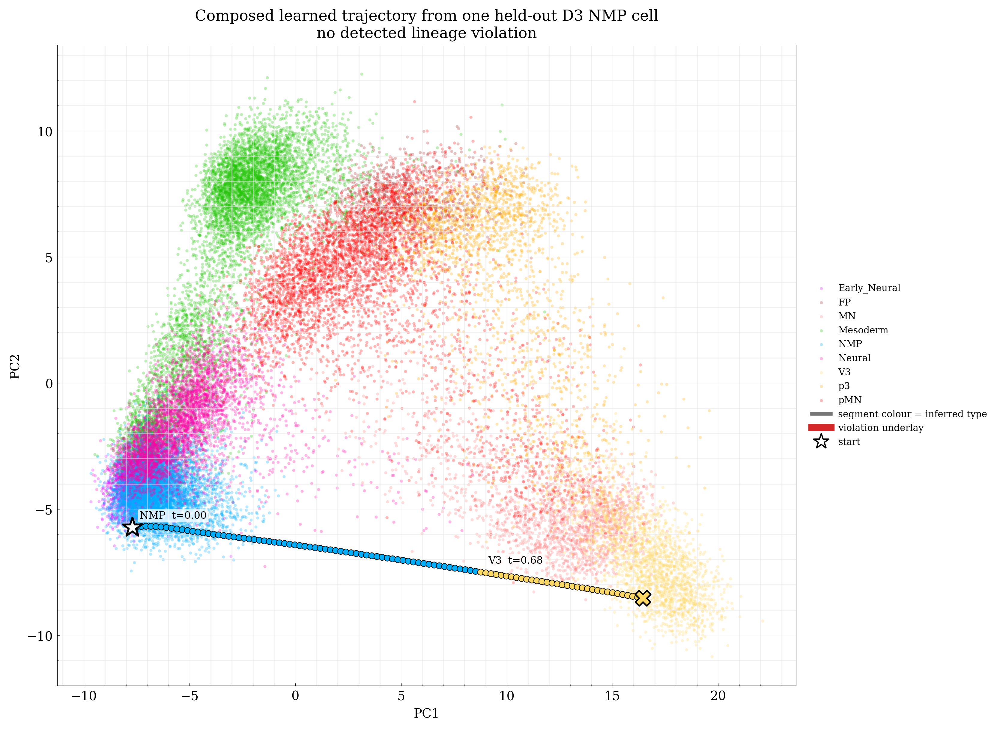

In [47]:
# Main figure: labelled population background plus one learned trajectory.
fig, ax = plt.subplots(figsize=(11, 8), constrained_layout=True)
for cell_type in celltype_order:
    idx = background_idx[cell_types[background_idx] == cell_type]
    ax.scatter(
        population_xy[idx, 0], population_xy[idx, 1],
        s=6, alpha=0.28, linewidths=0, color=CELLTYPE_COLORS[cell_type], label=cell_type,
        rasterized=True,
    )

segments = np.stack([path_xy[:-1], path_xy[1:]], axis=1)
# A segment receives the classifier label at its destination point.
segment_colors = [CELLTYPE_COLORS[str(c)] for c in assessment["pred_type"][1:]]
if first_invalid is not None:
    # Preserve the inferred-type colour and show invalidity as a wider red underlay.
    invalid_start = max(first_invalid - 1, 0)
    ax.add_collection(LineCollection(
        segments[invalid_start:], colors="#d62728", linewidths=6.0, zorder=6,
    ))
ax.add_collection(LineCollection(segments, colors=segment_colors, linewidths=3.0, zorder=7))
ax.scatter(
    path_xy[:, 0], path_xy[:, 1], s=24, zorder=8,
    c=[CELLTYPE_COLORS[str(c)] for c in assessment["pred_type"]],
    edgecolors=np.where(assessment["valid_so_far"], "#111111", "#d62728"),
    linewidths=0.55,
)
ax.scatter(*path_xy[0], marker="*", s=260, color="white", edgecolor="black", linewidth=1.5, zorder=10)
ax.scatter(*path_xy[-1], marker="X", s=150, color=CELLTYPE_COLORS[str(assessment['pred_type'][-1])], edgecolor="black", linewidth=1.2, zorder=10)

# Label only changes in the classifier-inferred cell type.
change_idx = np.flatnonzero(np.r_[True, assessment["pred_type"][1:] != assessment["pred_type"][:-1]])
for i in change_idx:
    ax.annotate(
        f"{assessment['pred_type'][i]}  t={i / N_STEPS:.2f}",
        path_xy[i], xytext=(6, 7), textcoords="offset points", fontsize=8,
        bbox=dict(boxstyle="round,pad=0.18", fc="white", ec="none", alpha=0.8),
        zorder=11,
    )

ax.set(
    xlabel=axis_labels[0], ylabel=axis_labels[1],
    title=(f"{TRAJECTORY_MODE.capitalize()} learned trajectory from one held-out "
           f"{cfg.problem.source_time} {START_CELL_TYPE} cell\n{status}"),
)
ax.grid(alpha=0.12)
handles, labels = ax.get_legend_handles_labels()
handles += [
    Line2D([0], [0], color="#777777", lw=3, label="segment colour = inferred type"),
    Line2D([0], [0], color="#d62728", lw=6, label="violation underlay"),
    Line2D([0], [0], marker="*", color="white", markeredgecolor="black", markersize=13, lw=0, label="start"),
]
ax.legend(handles=handles, loc="center left", bbox_to_anchor=(1.01, 0.5), frameon=False)
plt.show()

## Search specifically for multi-stage differentiation paths

Here a multi-stage path must have at least three consecutive classifier states—start, a distinct intermediate type, and final fate. `MIN_INTERMEDIATE_STEPS` prevents a one-point classifier flicker from counting as an intermediate state. The table reports the duration and confidence of every inferred stage so borderline examples remain visible rather than being over-interpreted.

In [48]:
MIN_INTERMEDIATE_STEPS = 3
MAX_MULTISTAGE_PLOTS = 6
ENDPOINT_SEARCH_START_TYPE = None  # search every held-out D3 cell; use e.g. "NMP" to restrict
TARGET_ENDPOINT_TYPES = ["Mesoderm", "pMN", "MN", "p3", "V3", "FP"]

if ENDPOINT_SEARCH_START_TYPE is None:
    endpoint_search_indices = source_holdout_global.copy()
else:
    endpoint_search_indices = source_holdout_global[
        cell_types[source_holdout_global] == ENDPOINT_SEARCH_START_TYPE
    ]
if len(endpoint_search_indices) == 0:
    raise ValueError("The multi-stage search contains no starting cells.")
endpoint_search_paths = make_trajectories(
    X[endpoint_search_indices], TRAJECTORY_MODE, N_STEPS
)
flat_paths = endpoint_search_paths.reshape(-1, endpoint_search_paths.shape[-1])
flat_type, flat_prob, flat_margin = maizels.classifier_predictions(
    classifier, classifier_names, scaler_mean, scaler_scale,
    flat_paths, batch_size=8192,
)
path_types = flat_type.reshape(endpoint_search_paths.shape[:2])
path_probs = flat_prob.reshape(endpoint_search_paths.shape[:2])
path_margins = flat_margin.reshape(endpoint_search_paths.shape[:2])
path_confident = (path_probs >= PROB_THRESHOLD) & (path_margins >= MARGIN_THRESHOLD)
search_start_types = cell_types[endpoint_search_indices]
path_valid = np.ones(len(endpoint_search_paths), dtype=bool)
first_invalid_step = np.full(len(endpoint_search_paths), -1, dtype=int)
for row_i in range(len(endpoint_search_paths)):
    current_type = str(search_start_types[row_i])
    for step_i in range(1, endpoint_search_paths.shape[1]):
        if not path_confident[row_i, step_i]:
            continue
        proposed_type = str(path_types[row_i, step_i])
        if proposed_type not in reachable.get(current_type, {current_type}):
            path_valid[row_i] = False
            first_invalid_step[row_i] = step_i
            break
        current_type = proposed_type


def classifier_runs(labels, probabilities):
    """Run-length encode classifier labels and retain timing/confidence."""
    labels = np.asarray(labels).astype(str)
    probabilities = np.asarray(probabilities, dtype=float)
    boundaries = np.r_[0, np.flatnonzero(labels[1:] != labels[:-1]) + 1, len(labels)]
    runs = []
    for start, stop in zip(boundaries[:-1], boundaries[1:]):
        runs.append({
            "cell_type": labels[start],
            "start_step": int(start),
            "stop_step": int(stop - 1),
            "n_points": int(stop - start),
            "tau_start": start / N_STEPS,
            "tau_stop": (stop - 1) / N_STEPS,
            "mean_probability": float(probabilities[start:stop].mean()),
            "min_probability": float(probabilities[start:stop].min()),
        })
    return runs

multistage_candidates = []
for row_i in range(len(endpoint_search_paths)):
    runs = classifier_runs(path_types[row_i], path_probs[row_i])
    intermediate_runs = [
        run for run in runs[1:-1] if run["n_points"] >= MIN_INTERMEDIATE_STEPS
    ]
    endpoint_is_observed = str(path_types[row_i, -1]) in TARGET_ENDPOINT_TYPES
    if path_valid[row_i] and endpoint_is_observed and intermediate_runs:
        score = max(run["n_points"] * run["mean_probability"] for run in intermediate_runs)
        multistage_candidates.append((score, row_i, runs, intermediate_runs))

multistage_candidates.sort(key=lambda item: item[0], reverse=True)
selected_multistage = multistage_candidates[:MAX_MULTISTAGE_PLOTS]
multistage_rows = []
for score, row_i, runs, intermediate_runs in selected_multistage:
    global_i = int(endpoint_search_indices[row_i])
    multistage_rows.append({
        "cell_id": str(data["obs_names"][global_i]),
        "start_type": str(cell_types[global_i]),
        "final_type": str(path_types[row_i, -1]),
        "classifier_sequence": " → ".join(run["cell_type"] for run in runs),
        "intermediate_duration": max(run["n_points"] for run in intermediate_runs) / N_STEPS,
        "intermediate_mean_probability": max(
            run["mean_probability"] for run in intermediate_runs
        ),
        "intermediate_min_probability": min(
            run["min_probability"] for run in intermediate_runs
        ),
    })

print(
    f"Found {len(multistage_candidates)} lineage-valid multi-stage paths among "
    f"{len(endpoint_search_paths)} searched {TRAJECTORY_MODE} paths "
    f"(minimum intermediate run: {MIN_INTERMEDIATE_STEPS} points)."
)
display(pd.DataFrame(multistage_rows).round({
    "intermediate_duration": 3,
    "intermediate_mean_probability": 3,
    "intermediate_min_probability": 3,
}))

# A long-form table makes the exact time span and confidence of each stage inspectable.
stage_rows = []
for _, row_i, runs, _ in selected_multistage:
    global_i = int(endpoint_search_indices[row_i])
    for stage_i, run in enumerate(runs):
        stage_rows.append({
            "cell_id": str(data["obs_names"][global_i]),
            "stage": stage_i,
            **run,
        })
display(pd.DataFrame(stage_rows).round({
    "tau_start": 2, "tau_stop": 2,
    "mean_probability": 3, "min_probability": 3,
}))

Found 16 lineage-valid multi-stage paths among 641 searched composed paths (minimum intermediate run: 3 points).


,cell_id,start_type,final_type,classifier_sequence,intermediate_duration,intermediate_mean_probability,intermediate_min_probability
0,MAI5081A1739_CAAGAGGAGG,NMP,V3,NMP → Early_Neural → V3,0.43,0.816,0.511
1,MAI5081A1417_ATTCCGTCCG,NMP,V3,NMP → p3 → V3,0.34,0.601,0.352
2,MAI5081A1313_TGAAGATGGA,NMP,V3,NMP → p3 → V3,0.26,0.579,0.415
3,MAI5081A1549_CGTGTTACCG,NMP,V3,NMP → p3 → V3,0.29,0.480,0.305
4,MAI5081A610_TCAGCATCCG,NMP,MN,NMP → Early_Neural → MN,0.21,0.605,0.414
5,MAI5081A1342_AATGGAAGAC,NMP,FP,NMP → p3 → FP,0.20,0.593,0.445


,cell_id,stage,cell_type,start_step,stop_step,n_points,tau_start,tau_stop,mean_probability,min_probability
0,MAI5081A1739_CAAGAGGAGG,0,NMP,0,3,4,0.00,0.03,0.563,0.519
1,MAI5081A1739_CAAGAGGAGG,1,Early_Neural,4,46,43,0.04,0.46,0.816,0.511
2,MAI5081A1739_CAAGAGGAGG,2,V3,47,100,54,0.47,1.00,0.956,0.481
3,MAI5081A1417_ATTCCGTCCG,0,NMP,0,63,64,0.00,0.63,0.742,0.329
4,MAI5081A1417_ATTCCGTCCG,1,p3,64,97,34,0.64,0.97,0.601,0.352
5,MAI5081A1417_ATTCCGTCCG,2,V3,98,100,3,0.98,1.00,0.514,0.495
6,MAI5081A1313_TGAAGATGGA,0,NMP,0,51,52,0.00,0.51,0.936,0.461
7,MAI5081A1313_TGAAGATGGA,1,p3,52,77,26,0.52,0.77,0.579,0.415
8,MAI5081A1313_TGAAGATGGA,2,V3,78,100,23,0.78,1.00,0.635,0.498
9,MAI5081A1549_CGTGTTACCG,0,NMP,0,44,45,0.00,0.44,0.883,0.350


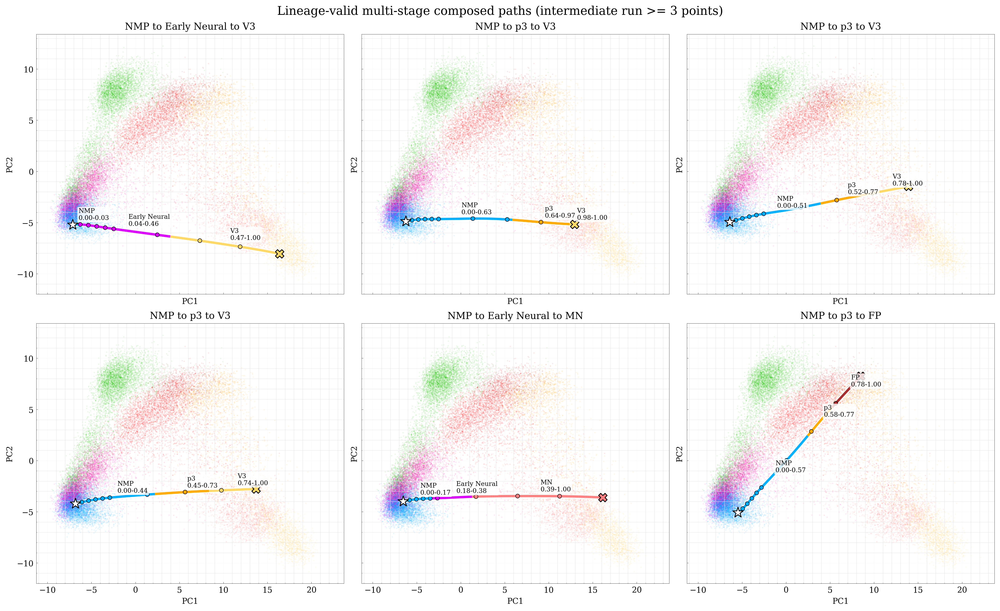

In [49]:
# Plot every selected multi-stage example with segment-level classifier colours.
multistage_day_taus = np.asarray([
    (maizels.parse_timepoint(day) - maizels.parse_timepoint(cfg.problem.source_time))
    / (maizels.parse_timepoint(cfg.problem.target_time) - maizels.parse_timepoint(cfg.problem.source_time))
    for day in sorted(set(timepoints), key=maizels.parse_timepoint)
])
multistage_day_steps = np.unique(
    np.clip(np.rint(multistage_day_taus * N_STEPS).astype(int), 0, N_STEPS)
)
if not selected_multistage:
    print(
        "No qualifying path was found. Try another TRAJECTORY_MODE, lower "
        "MIN_INTERMEDIATE_STEPS, or set ENDPOINT_SEARCH_START_TYPE = None."
    )
else:
    n_cols = min(3, len(selected_multistage))
    n_rows = int(np.ceil(len(selected_multistage) / n_cols))
    fig, axes = plt.subplots(
        n_rows, n_cols, figsize=(5.8 * n_cols, 5.3 * n_rows),
        sharex=True, sharey=True, constrained_layout=True, squeeze=False,
    )
    axes = axes.ravel()

    for ax, (_, row_i, runs, _) in zip(axes, selected_multistage):
        for background_type in celltype_order:
            idx = background_idx[cell_types[background_idx] == background_type]
            ax.scatter(
                population_xy[idx, 0], population_xy[idx, 1],
                s=2.5, alpha=0.10, linewidths=0,
                color=CELLTYPE_COLORS[background_type], rasterized=True,
            )

        xy = project(endpoint_search_paths[row_i])
        segments = np.stack([xy[:-1], xy[1:]], axis=1)
        segment_colors = [CELLTYPE_COLORS[str(c)] for c in path_types[row_i, 1:]]
        ax.add_collection(LineCollection(
            segments, colors="white", linewidths=5.2, alpha=0.95, zorder=6,
        ))
        ax.add_collection(LineCollection(
            segments, colors=segment_colors, linewidths=3.0, zorder=7,
        ))
        ax.scatter(
            xy[multistage_day_steps, 0], xy[multistage_day_steps, 1], s=25,
            c=[CELLTYPE_COLORS[str(path_types[row_i, step])] for step in multistage_day_steps],
            edgecolor="black", linewidth=0.6, zorder=8,
        )
        ax.scatter(*xy[0], marker="*", s=190, color="white", edgecolor="black", zorder=9)
        ax.scatter(
            *xy[-1], marker="X", s=115,
            color=CELLTYPE_COLORS[str(path_types[row_i, -1])],
            edgecolor="black", zorder=9,
        )

        for run in runs:
            midpoint = (run["start_step"] + run["stop_step"]) // 2
            ax.annotate(
                f"{run['cell_type'].replace('_', ' ')}\n{run['tau_start']:.2f}-{run['tau_stop']:.2f}",
                xy[midpoint], xytext=(5, 6), textcoords="offset points", fontsize=8,
                bbox=dict(boxstyle="round,pad=0.18", fc="white", ec="none", alpha=0.82),
                zorder=10,
            )

        sequence_text = " to ".join(run["cell_type"].replace("_", " ") for run in runs)
        ax.set_title(sequence_text)
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])
        ax.grid(alpha=0.10)

    for ax in axes[len(selected_multistage):]:
        ax.set_visible(False)
    fig.suptitle(
        f"Lineage-valid multi-stage {TRAJECTORY_MODE} paths "
        f"(intermediate run >= {MIN_INTERMEDIATE_STEPS} points)",
        fontsize=15,
    )
    plt.show()

## Several starting points

The next cell repeats the same calculation for several held-out cells of the selected starting type. Each path is coloured by its classifier-inferred endpoint. Any path with a detected forbidden transition is drawn dashed with red point outlines. Adjust `MULTI_START_RANKS` to inspect central or increasingly peripheral cells.

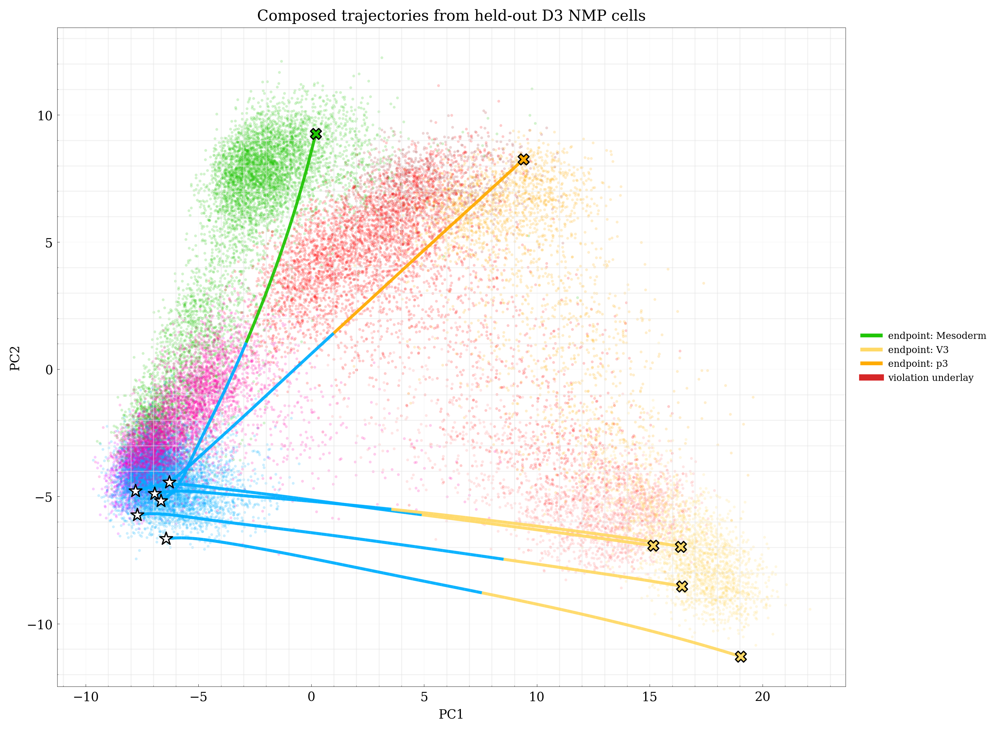

,start_rank,cell_id,endpoint_type,lineage_valid,first_invalid_tau
0,0,MAI5081A666_AGACGCAAGA,V3,True,NaN
1,10,MAI5081A587_ACTGGTTCCG,V3,True,NaN
2,25,MAI5081A640_TTGGTCGCTC,p3,True,NaN
3,50,MAI5081A497_AGATGCTCCG,V3,True,NaN
4,100,MAI5081A716_CTGTACCAGG,V3,True,NaN
5,200,MAI5081A449_AACGCGGTAG,Mesoderm,True,NaN


In [50]:
MULTI_START_RANKS = [0, 10, 25, 50, 100, 200]
multi_ranks = [rank for rank in MULTI_START_RANKS if rank < len(ranked)]
multi_indices = ranked[multi_ranks]
multi_paths = make_trajectories(X[multi_indices], TRAJECTORY_MODE, N_STEPS)
multi_xy = [project(p) for p in multi_paths]
multi_assessment = [
    assess_trajectory(p, cell_types[idx]) for p, idx in zip(multi_paths, multi_indices)
]

fig, ax = plt.subplots(figsize=(11, 8), constrained_layout=True)
for cell_type in celltype_order:
    idx = background_idx[cell_types[background_idx] == cell_type]
    ax.scatter(
        population_xy[idx, 0], population_xy[idx, 1], s=5, alpha=0.20, linewidths=0,
        color=CELLTYPE_COLORS[cell_type], rasterized=True,
    )

rows = []
for rank, idx, xy, result in zip(multi_ranks, multi_indices, multi_xy, multi_assessment):
    endpoint_type = str(result["pred_type"][-1])
    invalid = result["first_invalid"] is not None
    segments = np.stack([xy[:-1], xy[1:]], axis=1)
    segment_colors = [CELLTYPE_COLORS[str(c)] for c in result["pred_type"][1:]]
    if invalid:
        invalid_start = max(result["first_invalid"] - 1, 0)
        ax.add_collection(LineCollection(
            segments[invalid_start:], colors="#d62728", linewidths=5.0, zorder=5,
        ))
    ax.add_collection(LineCollection(
        segments, colors=segment_colors, linewidths=2.4, alpha=0.95, zorder=6,
    ))
    ax.scatter(*xy[0], marker="*", s=115, color="white", edgecolor="black", zorder=8)
    ax.scatter(*xy[-1], marker="X", s=75, color=CELLTYPE_COLORS[endpoint_type], edgecolor="red" if invalid else "black", zorder=8)
    rows.append({
        "start_rank": rank, "cell_id": data["obs_names"][idx],
        "endpoint_type": endpoint_type, "lineage_valid": not invalid,
        "first_invalid_tau": np.nan if not invalid else result["first_invalid"] / N_STEPS,
    })

ax.set(
    xlabel=axis_labels[0], ylabel=axis_labels[1],
    title=f"{TRAJECTORY_MODE.capitalize()} trajectories from held-out {cfg.problem.source_time} {START_CELL_TYPE} cells",
)
ax.grid(alpha=0.12)
endpoint_types = sorted({row["endpoint_type"] for row in rows})
legend_handles = [
    Line2D([0], [0], color=CELLTYPE_COLORS[name], lw=3, label=f"endpoint: {name}")
    for name in endpoint_types
] + [Line2D([0], [0], color="#d62728", lw=5, label="violation underlay")]
ax.legend(handles=legend_handles, loc="center left", bbox_to_anchor=(1.01, 0.5), frameon=False)
plt.show()
display(pd.DataFrame(rows))

## Find one learned path for each observed D8 endpoint type

This search evaluates all held-out D3 cells by default. For each cell type observed at D8, it keeps paths whose final model state is assigned to that type and whose complete classifier sequence is lineage-valid. Among those, it selects the endpoint closest to observed D8 cells of the requested type in scaled PCA50 space. Set `ENDPOINT_SEARCH_START_TYPE` to a label such as `"NMP"` to restrict the search.

A blank panel is informative: it means this model/checkpoint did not produce a qualifying path to that endpoint from the searched starting population. Set `ENDPOINT_SEARCH_START_TYPE = None` to search every held-out D3 cell, including the small D3 Mesoderm population.

In [51]:
ENDPOINT_SEARCH_START_TYPE = None  # search every held-out D3 cell; use e.g. "NMP" to restrict
TARGET_ENDPOINT_TYPES = ["NMP", "Neural", "Early_Neural", "Mesoderm", "pMN", "MN", "p3", "V3", "FP"]

if ENDPOINT_SEARCH_START_TYPE is None:
    endpoint_search_indices = source_holdout_global.copy()
else:
    endpoint_search_indices = source_holdout_global[
        cell_types[source_holdout_global] == ENDPOINT_SEARCH_START_TYPE
    ]
if len(endpoint_search_indices) == 0:
    raise ValueError("The endpoint search contains no starting cells.")

print(
    f"Generating {TRAJECTORY_MODE} paths for {len(endpoint_search_indices):,} "
    f"held-out {cfg.problem.source_time} starts..."
)
endpoint_search_paths = make_trajectories(
    X[endpoint_search_indices], TRAJECTORY_MODE, N_STEPS
)

# Classify every point in one batched call, then reproduce the experiment's
# forward-only lineage check for each trajectory.
flat_paths = endpoint_search_paths.reshape(-1, endpoint_search_paths.shape[-1])
flat_type, flat_prob, flat_margin = maizels.classifier_predictions(
    classifier, classifier_names, scaler_mean, scaler_scale,
    flat_paths, batch_size=8192,
)
path_types = flat_type.reshape(endpoint_search_paths.shape[:2])
path_probs = flat_prob.reshape(endpoint_search_paths.shape[:2])
path_margins = flat_margin.reshape(endpoint_search_paths.shape[:2])
path_confident = (path_probs >= PROB_THRESHOLD) & (path_margins >= MARGIN_THRESHOLD)

search_start_types = cell_types[endpoint_search_indices]
path_valid = np.ones(len(endpoint_search_paths), dtype=bool)
first_invalid_step = np.full(len(endpoint_search_paths), -1, dtype=int)
for row_i in range(len(endpoint_search_paths)):
    current_type = str(search_start_types[row_i])
    for step_i in range(1, endpoint_search_paths.shape[1]):
        if not path_confident[row_i, step_i]:
            continue
        proposed_type = str(path_types[row_i, step_i])
        if proposed_type not in reachable.get(current_type, {current_type}):
            path_valid[row_i] = False
            first_invalid_step[row_i] = step_i
            break
        current_type = proposed_type

endpoint_predictions = path_types[:, -1]
endpoint_probabilities = path_probs[:, -1]
selected_endpoint_paths = {}
endpoint_rows = []

for endpoint_type in TARGET_ENDPOINT_TYPES:
    predicted_mask = endpoint_predictions == endpoint_type
    valid_candidates = np.flatnonzero(predicted_mask & path_valid)
    row = {
        "endpoint_type": endpoint_type,
        "observed_D8_cells": int(np.sum((timepoints == cfg.problem.target_time) & (cell_types == endpoint_type))),
        "predicted_paths": int(predicted_mask.sum()),
        "lineage_valid_paths": int(len(valid_candidates)),
        "selected_start_cell": None,
        "selected_start_type": None,
        "endpoint_probability": np.nan,
        "mean_distance_to_D8_type": np.nan,
        "classifier_sequence": None,
    }

    target_population = X_scaled[
        (timepoints == cfg.problem.target_time) & (cell_types == endpoint_type)
    ]
    if len(valid_candidates) and len(target_population):
        target_nn = NearestNeighbors(
            n_neighbors=min(25, len(target_population)), n_jobs=1
        ).fit(target_population)
        candidate_endpoints = (
            endpoint_search_paths[valid_candidates, -1] - scaler_mean
        ) / scaler_scale
        target_distances, _ = target_nn.kneighbors(candidate_endpoints)
        mean_target_distance = target_distances.mean(axis=1)
        # Primary criterion: closeness to the observed target-type population.
        # Endpoint classifier confidence breaks near-ties.
        ordering = np.lexsort((
            -endpoint_probabilities[valid_candidates], mean_target_distance
        ))
        chosen_local = int(ordering[0])
        chosen_path_i = int(valid_candidates[chosen_local])
        chosen_global_i = int(endpoint_search_indices[chosen_path_i])
        chosen_sequence = path_types[chosen_path_i]
        changes = np.r_[True, chosen_sequence[1:] != chosen_sequence[:-1]]
        compact_sequence = " → ".join(chosen_sequence[changes].tolist())

        selected_endpoint_paths[endpoint_type] = {
            "path": endpoint_search_paths[chosen_path_i],
            "path_xy": project(endpoint_search_paths[chosen_path_i]),
            "search_row": chosen_path_i,
            "global_index": chosen_global_i,
        }
        row.update({
            "selected_start_cell": str(data["obs_names"][chosen_global_i]),
            "selected_start_type": str(cell_types[chosen_global_i]),
            "endpoint_probability": float(endpoint_probabilities[chosen_path_i]),
            "mean_distance_to_D8_type": float(mean_target_distance[chosen_local]),
            "classifier_sequence": compact_sequence,
        })
    endpoint_rows.append(row)

endpoint_search_summary = pd.DataFrame(endpoint_rows)
display(endpoint_search_summary.round({
    "endpoint_probability": 3, "mean_distance_to_D8_type": 2,
}))
missing_endpoint_types = endpoint_search_summary.loc[
    endpoint_search_summary["lineage_valid_paths"] == 0, "endpoint_type"
].tolist()
if missing_endpoint_types:
    print("No lineage-valid path found for:", ", ".join(missing_endpoint_types))

Generating composed paths for 641 held-out D3 starts...


,endpoint_type,observed_D8_cells,predicted_paths,lineage_valid_paths,selected_start_cell,selected_start_type,endpoint_probability,mean_distance_to_D8_type,classifier_sequence
0,NMP,0,0,0,None,None,NaN,NaN,None
1,Neural,0,0,0,None,None,NaN,NaN,None
2,Early_Neural,0,0,0,None,None,NaN,NaN,None
3,Mesoderm,358,86,83,MAI5081A1688_TCAATTGACG,NMP,1.000,5.90,NMP → Mesoderm
4,pMN,350,28,19,MAI5081A450_CGCTTGTTAT,NMP,0.980,5.96,NMP → pMN
5,MN,151,30,29,MAI5081A446_TCACAGTTGC,NMP,0.951,7.11,NMP → MN
6,p3,1055,130,122,MAI5081A1407_AACGCGGTAG,NMP,1.000,5.16,NMP → p3
7,V3,1574,300,287,MAI5081A451_GTTCTAATGG,NMP,1.000,4.74,NMP → V3
8,FP,268,67,58,MAI5081A1180_CAAGAGGAGG,NMP,1.000,5.62,NMP → FP


No lineage-valid path found for: NMP, Neural, Early_Neural


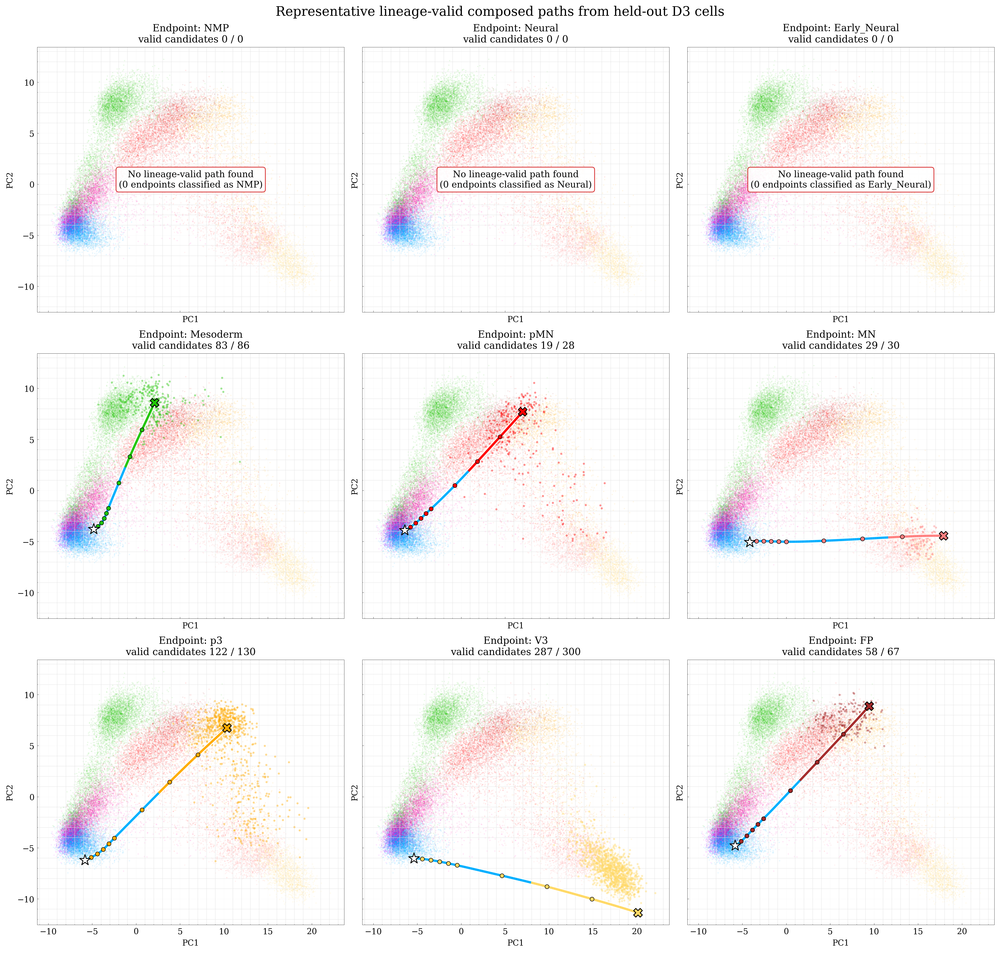

In [52]:
# One panel per observed endpoint type, including explicit empty panels.
n_cols = 3
n_rows = int(np.ceil(len(TARGET_ENDPOINT_TYPES) / n_cols))
fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(17, 5.4 * n_rows),
    sharex=True, sharey=True, constrained_layout=True,
)
axes = np.asarray(axes).ravel()
day_taus = np.asarray([
    (maizels.parse_timepoint(day) - maizels.parse_timepoint(cfg.problem.source_time))
    / (maizels.parse_timepoint(cfg.problem.target_time) - maizels.parse_timepoint(cfg.problem.source_time))
    for day in sorted(set(timepoints), key=maizels.parse_timepoint)
])
day_steps = np.unique(np.clip(np.rint(day_taus * N_STEPS).astype(int), 0, N_STEPS))

for ax, endpoint_type in zip(axes, TARGET_ENDPOINT_TYPES):
    for background_type in celltype_order:
        idx = background_idx[cell_types[background_idx] == background_type]
        ax.scatter(
            population_xy[idx, 0], population_xy[idx, 1],
            s=2.5, alpha=0.10, linewidths=0,
            color=CELLTYPE_COLORS[background_type], rasterized=True,
        )
    target_bg = background_idx[
        (timepoints[background_idx] == cfg.problem.target_time)
        & (cell_types[background_idx] == endpoint_type)
    ]
    ax.scatter(
        population_xy[target_bg, 0], population_xy[target_bg, 1],
        s=7, alpha=0.38, linewidths=0, color=CELLTYPE_COLORS[endpoint_type],
        rasterized=True, zorder=3,
    )

    selected = selected_endpoint_paths.get(endpoint_type)
    summary_row = endpoint_search_summary.loc[
        endpoint_search_summary["endpoint_type"] == endpoint_type
    ].iloc[0]
    if selected is None:
        ax.text(
            0.5, 0.5,
            f"No lineage-valid path found\n"
            f"({summary_row['predicted_paths']} endpoints classified as {endpoint_type})",
            transform=ax.transAxes, ha="center", va="center", fontsize=11,
            bbox=dict(boxstyle="round", fc="white", ec="#d62728", alpha=0.9),
            zorder=10,
        )
    else:
        xy = selected["path_xy"]
        color = CELLTYPE_COLORS[endpoint_type]
        selected_types = path_types[selected["search_row"]]
        segments = np.stack([xy[:-1], xy[1:]], axis=1)
        segment_colors = [CELLTYPE_COLORS[str(c)] for c in selected_types[1:]]
        # White underlay keeps the classifier-coloured segments visible.
        ax.add_collection(LineCollection(
            segments, colors="white", linewidths=5.2, alpha=0.95, zorder=6,
        ))
        ax.add_collection(LineCollection(
            segments, colors=segment_colors, linewidths=2.8, zorder=7,
        ))
        ax.scatter(
            xy[day_steps, 0], xy[day_steps, 1], s=25,
            color=color, edgecolor="black", linewidth=0.6, zorder=8,
        )
        ax.scatter(*xy[0], marker="*", s=190, color="white", edgecolor="black", zorder=9)
        ax.scatter(*xy[-1], marker="X", s=115, color=color, edgecolor="black", zorder=9)

    ax.set_title(
        f"Endpoint: {endpoint_type}\n"
        f"valid candidates {summary_row['lineage_valid_paths']} / {summary_row['predicted_paths']}"
    )
    ax.set_xlabel(axis_labels[0])
    ax.set_ylabel(axis_labels[1])
    ax.grid(alpha=0.10)

for ax in axes[len(TARGET_ENDPOINT_TYPES):]:
    ax.set_visible(False)
fig.suptitle(
    f"Representative lineage-valid {TRAJECTORY_MODE} paths from held-out "
    f"{cfg.problem.source_time} {ENDPOINT_SEARCH_START_TYPE or 'cells'}",
    fontsize=16,
)
plt.show()

## Reading the result

- Background colour is the observed annotation; trajectory point and segment colour is the classifier-inferred annotation in the same PCA50 space. A segment uses the inferred label at its destination point.
- `local_population_type` is the majority annotation among the 50 nearest observed cells after classifier scaling. Low `local_fraction` or a large neighbour distance indicates an ambiguous or off-manifold region.
- The endpoint-search panels use the same held-out source pool and choose the lineage-valid endpoint closest to real D8 cells of that type. `predicted_paths = 0` means the model never produced that endpoint in the searched pool; a positive predicted count but zero valid count means all such paths violated the lineage rule.
- In `descendant` mode, a path may skip an intermediate label between sampled points as long as the later label is downstream in the lineage graph. Use `direct` to require every confident change to be a self-transition or one explicit graph edge.
- `direct` plots $X_{0,t}(x_0)$ and is the path directly constrained by the default loss-point experiment. `composed` repeatedly applies short flow maps; `euler` integrates the learned diagonal vector field. Differences between these three modes are themselves a useful consistency diagnostic.
- A clean 2D line is not proof of biological validity: the lineage decision is made in all 50 dimensions. Conversely, a UMAP curve can look sharp or curved because UMAP is nonlinear. Confirm suspicious cases with `PROJECTION = "pc12"` and the diagnostic table.

In [53]:
# Report lineage validity across one learned trajectory from every D3 cell.
all_d3_indices = source_holdout_global

# Reuse the endpoint-search results when that search covered every D3 start.
if np.array_equal(endpoint_search_indices, all_d3_indices):
    all_d3_path_types = path_types
    all_d3_path_confident = path_confident
else:
    print(f"Generating {TRAJECTORY_MODE} paths for all {len(all_d3_indices):,} D3 cells...")
    all_d3_paths = make_trajectories(X[all_d3_indices], TRAJECTORY_MODE, N_STEPS)
    all_d3_flat = all_d3_paths.reshape(-1, all_d3_paths.shape[-1])
    all_d3_type, all_d3_prob, all_d3_margin = maizels.classifier_predictions(
        classifier, classifier_names, scaler_mean, scaler_scale,
        all_d3_flat, batch_size=8192,
    )
    all_d3_path_types = all_d3_type.reshape(all_d3_paths.shape[:2])
    all_d3_path_confident = (
        (all_d3_prob.reshape(all_d3_paths.shape[:2]) >= PROB_THRESHOLD)
        & (all_d3_margin.reshape(all_d3_paths.shape[:2]) >= MARGIN_THRESHOLD)
    )

all_d3_valid = np.ones(len(all_d3_indices), dtype=bool)
for row_i, global_i in enumerate(all_d3_indices):
    current_type = str(cell_types[global_i])
    for step_i in range(1, all_d3_path_types.shape[1]):
        if not all_d3_path_confident[row_i, step_i]:
            continue
        proposed_type = str(all_d3_path_types[row_i, step_i])
        if proposed_type not in reachable.get(current_type, {current_type}):
            all_d3_valid[row_i] = False
            break
        current_type = proposed_type

n_total = len(all_d3_valid)
n_valid = int(all_d3_valid.sum())
n_invalid = int(n_total - n_valid)
all_d3_validity_summary = pd.DataFrame([{
    "trajectory_mode": TRAJECTORY_MODE,
    "lineage_mode": LINEAGE_MODE,
    "D3_starting_cells": n_total,
    "valid_trajectories": n_valid,
    "invalid_trajectories": n_invalid,
    "valid_percent": 100.0 * n_valid / n_total,
    "invalid_percent": 100.0 * n_invalid / n_total,
}])
print(
    f"All D3 starts: {n_valid:,} valid / {n_invalid:,} invalid "
    f"out of {n_total:,} {TRAJECTORY_MODE} trajectories."
)
display(all_d3_validity_summary.round(2))

All D3 starts: 598 valid / 43 invalid out of 641 composed trajectories.


,trajectory_mode,lineage_mode,D3_starting_cells,valid_trajectories,invalid_trajectories,valid_percent,invalid_percent
0,composed,descendant,641,598,43,93.29,6.71
